In [83]:
from keras.layers import Input, Lambda, Dense, Flatten
from keras.models import Model
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input
from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
import numpy as np
from glob import glob
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

In [84]:
IMAGE_SIZE = [300, 150]

In [85]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [86]:
!ls '/content/drive/MyDrive/LabeledScooters/Final_Folder/4RESIZED_FRAMES/'

Train  Validation


In [102]:
train_path = '/content/drive/MyDrive/LabeledScooters/Final_Folder/4RESIZED_FRAMES/Train'
test_path = '/content/drive/MyDrive/LabeledScooters/Final_Folder/4RESIZED_FRAMES/Validation'

Working with 480 images
Image examples: 
0_vid_17_320.jpg


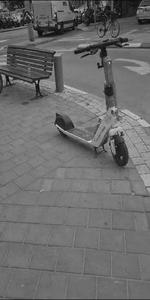

0_vid_17_300.jpg


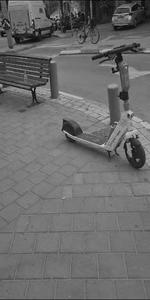

In [103]:
from PIL import Image
import os
from IPython.display import display
from IPython.display import Image as _Imgdis
# creating a object


folder = train_path+'/0'


onlybenignfiles = [f for f in os.listdir(folder) if os.path.isfile(os.path.join(folder, f))]
print("Working with {0} images".format(len(onlybenignfiles)))
print("Image examples: ")


for i in range(2):
    print(onlybenignfiles[i])
    display(_Imgdis(filename=folder + "/" + onlybenignfiles[i], width=IMAGE_SIZE[1], height=IMAGE_SIZE[0]))

In [104]:
vgg = VGG16(input_shape=IMAGE_SIZE + [3], weights='imagenet', include_top=False)

In [105]:
for layer in vgg.layers:
  layer.trainable = False

In [106]:
folders = glob('/content/drive/MyDrive/LabeledScooters/Final_Folder/4RESIZED_FRAMES/Train/*')
print(len(folders))

4


In [107]:
x = Flatten()(vgg.output)
prediction = Dense(len(folders), activation='softmax')(x)
model = Model(inputs=vgg.input, outputs=prediction)
model.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 300, 150, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 300, 150, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 300, 150, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 150, 75, 64)       0         
                                                                 
 block2_conv1 (Conv2D)       (None, 150, 75, 128)      73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 150, 75, 128)      147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 75, 37, 128)       0   

In [108]:
from keras import optimizers


adam = optimizers.Adam()
model.compile(loss='binary_crossentropy',
              optimizer=adam,
              metrics=['accuracy'])

In [109]:
train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input
    # rotation_range=20,
    # width_shift_range=0.2,
    # height_shift_range=0.2,
    # shear_range=0.2,
    # horizontal_flip=True,
    # fill_mode='nearest'
    )

In [110]:
test_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input
    # rotation_range=20,
    # width_shift_range=0.2,
    # height_shift_range=0.2,
    # shear_range=0.2,
    # horizontal_flip=True,
    # fill_mode='nearest'
    )

In [111]:
train_set = train_datagen.flow_from_directory(train_path,
                                                 target_size = (300, 150),
                                                 batch_size = 32,
                                                 class_mode = 'categorical')

Found 1557 images belonging to 4 classes.


In [112]:
test_set = test_datagen.flow_from_directory(test_path,
                                            target_size = (300, 150),
                                            batch_size = 32,
                                            class_mode = 'categorical')

Found 852 images belonging to 4 classes.


In [113]:
from datetime import datetime
from keras.callbacks import ModelCheckpoint

checkpoint = ModelCheckpoint(filepath='mymodel.h5',
                             monitor='val_accuracy',  # Monitor validation accuracy
                             verbose=1,
                             save_best_only=True,
                             mode='max')  # Save the best model based on the maximum validation accuracy

callbacks = [checkpoint]

start = datetime.now()

model_history = model.fit(
    train_set,
    validation_data=test_set,
    epochs=10,
    callbacks=callbacks,
    verbose=2
)

duration = datetime.now() - start
print("Training completed in time: ", duration)

Epoch 1/10

Epoch 1: val_accuracy improved from -inf to 0.73944, saving model to mymodel.h5
49/49 - 11s - loss: 1.1994 - accuracy: 0.7643 - val_loss: 1.5664 - val_accuracy: 0.7394 - 11s/epoch - 224ms/step
Epoch 2/10

Epoch 2: val_accuracy improved from 0.73944 to 0.74296, saving model to mymodel.h5
49/49 - 10s - loss: 0.0838 - accuracy: 0.9884 - val_loss: 1.4866 - val_accuracy: 0.7430 - 10s/epoch - 203ms/step
Epoch 3/10

Epoch 3: val_accuracy improved from 0.74296 to 0.75000, saving model to mymodel.h5
49/49 - 11s - loss: 0.0238 - accuracy: 0.9974 - val_loss: 1.4957 - val_accuracy: 0.7500 - 11s/epoch - 231ms/step
Epoch 4/10

Epoch 4: val_accuracy improved from 0.75000 to 0.76643, saving model to mymodel.h5
49/49 - 10s - loss: 0.0054 - accuracy: 1.0000 - val_loss: 1.4291 - val_accuracy: 0.7664 - 10s/epoch - 204ms/step
Epoch 5/10

Epoch 5: val_accuracy improved from 0.76643 to 0.76878, saving model to mymodel.h5
49/49 - 10s - loss: 2.1955e-04 - accuracy: 1.0000 - val_loss: 1.4677 - val_a

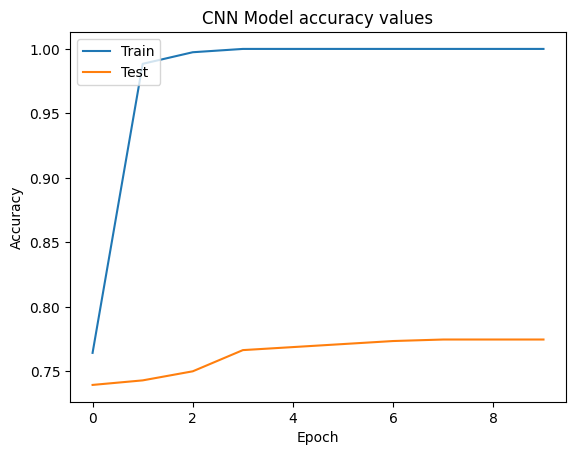

In [118]:
_# Plot training & validation loss values
plt.plot(model_history.history['accuracy'])
plt.plot(model_history.history['val_accuracy'])
plt.title('CNN Model accuracy values')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()


In [120]:
from sklearn.metrics import confusion_matrix

test_images, test_labels = [], []

for i in range(len(test_set)):
    batch_images, batch_labels = test_set[i]
    test_images.append(batch_images)
    test_labels.append(np.argmax(batch_labels, axis=1))

test_images = np.concatenate(test_images)
test_labels = np.concatenate(test_labels)

# Make predictions using the trained model
predictions = model.predict(test_images)
predicted_labels = np.argmax(predictions, axis=1)

# Calculate the confusion matrix
cm = confusion_matrix(test_labels, predicted_labels)
print("Confusion Matrix:")
print(cm)

27/27 [==============================] - 3s 126ms/step
Confusion Matrix:
[[162   6   1  93]
 [ 15 334   0   5]
 [  6   1  65   5]
 [ 53   2   5  99]]


In [116]:
indices = np.where(test_labels != predicted_labels)

Predicted label: 1, True lable: 3


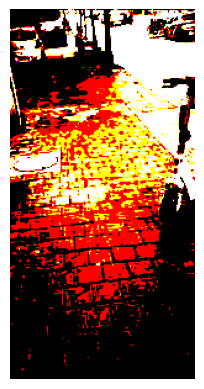

Predicted label: 3, True lable: 0


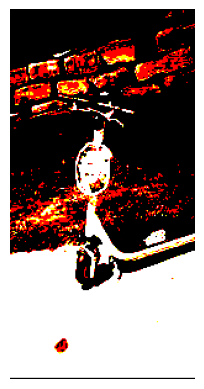

Predicted label: 3, True lable: 0


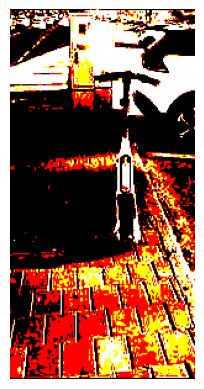

Predicted label: 0, True lable: 3


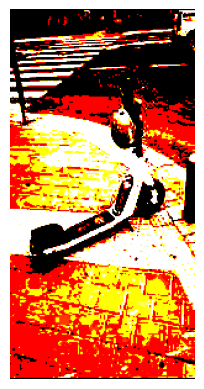

Predicted label: 0, True lable: 3


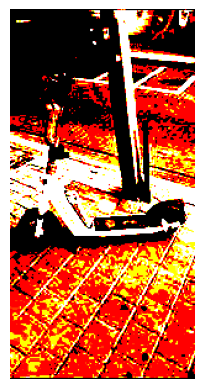

Predicted label: 3, True lable: 0


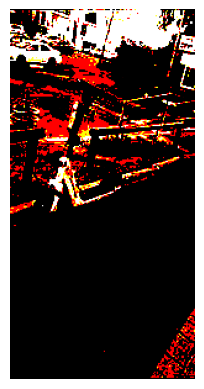

Predicted label: 3, True lable: 0


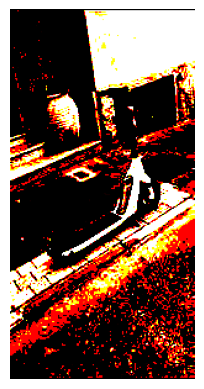

Predicted label: 3, True lable: 0


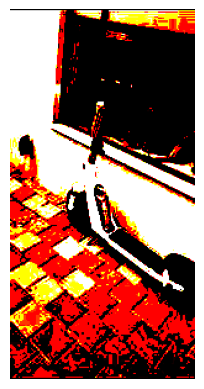

Predicted label: 0, True lable: 1


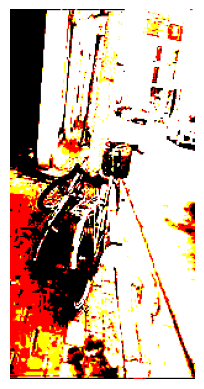

Predicted label: 0, True lable: 3


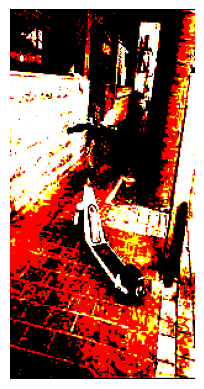

Predicted label: 3, True lable: 0


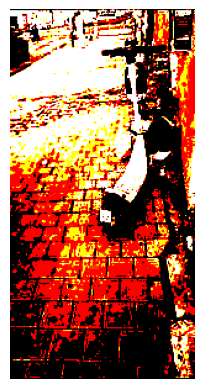

Predicted label: 3, True lable: 0


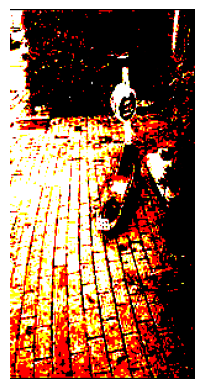

Predicted label: 0, True lable: 1


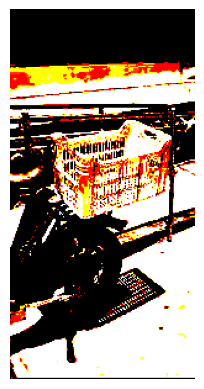

Predicted label: 0, True lable: 3


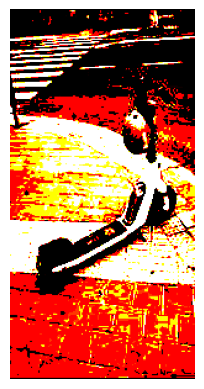

Predicted label: 3, True lable: 0


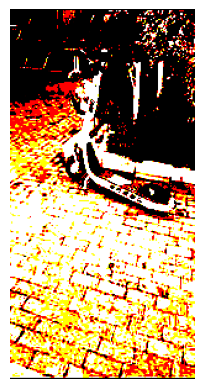

Predicted label: 3, True lable: 0


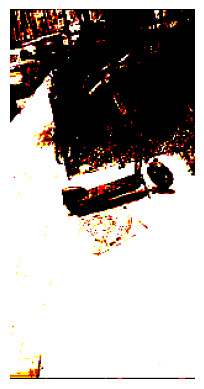

Predicted label: 3, True lable: 0


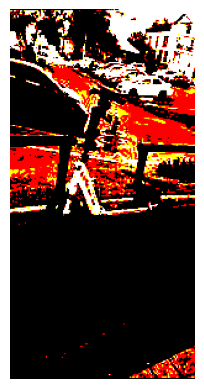

Predicted label: 0, True lable: 1


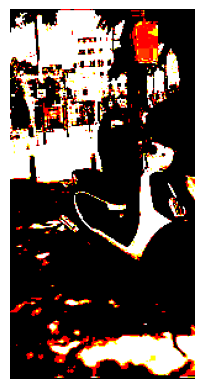

Predicted label: 3, True lable: 0


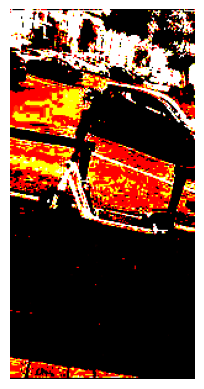

Predicted label: 3, True lable: 0


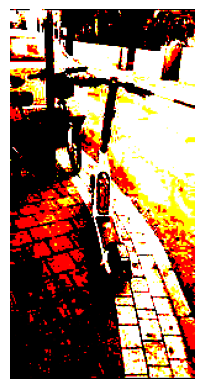

Predicted label: 0, True lable: 1


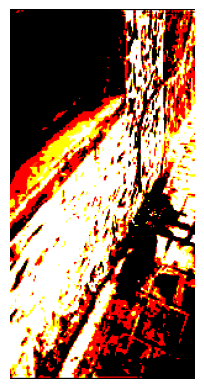

Predicted label: 3, True lable: 0


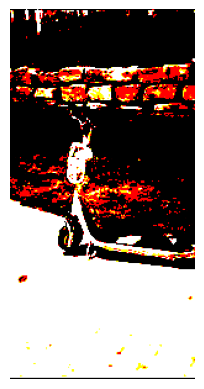

Predicted label: 3, True lable: 1


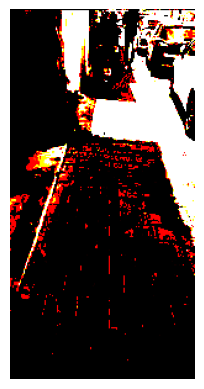

Predicted label: 3, True lable: 0


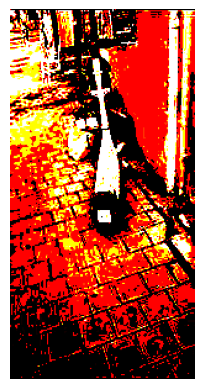

Predicted label: 3, True lable: 0


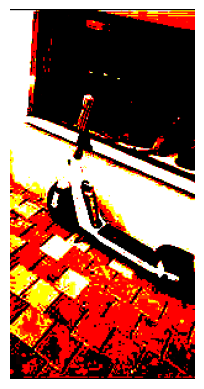

Predicted label: 3, True lable: 1


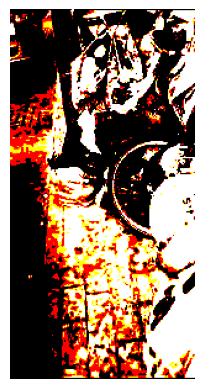

Predicted label: 0, True lable: 1


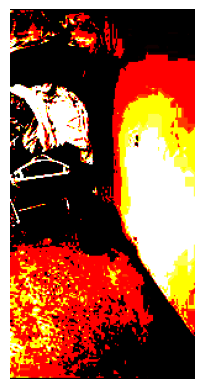

Predicted label: 3, True lable: 0


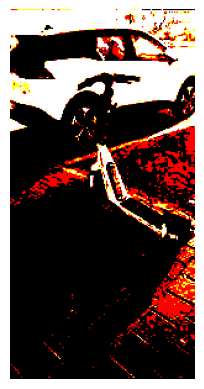

Predicted label: 0, True lable: 1


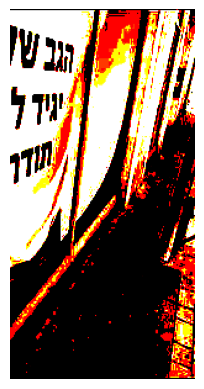

Predicted label: 3, True lable: 0


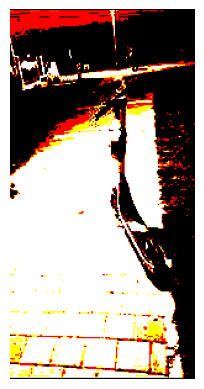

Predicted label: 3, True lable: 0


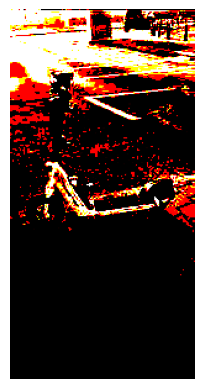

Predicted label: 3, True lable: 0


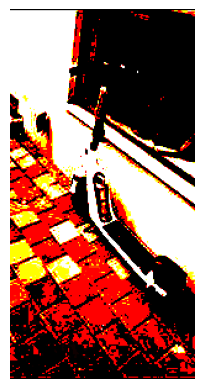

Predicted label: 3, True lable: 0


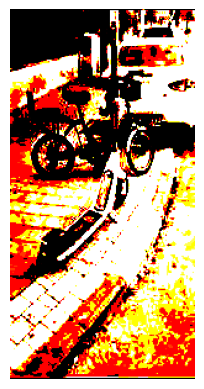

Predicted label: 3, True lable: 0


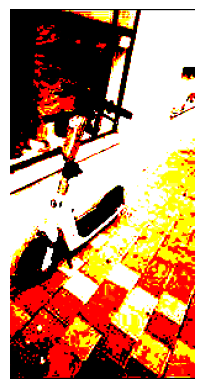

Predicted label: 3, True lable: 0


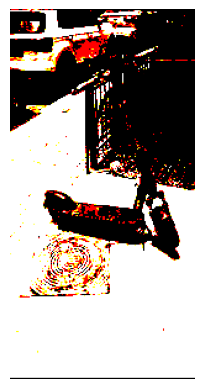

Predicted label: 3, True lable: 0


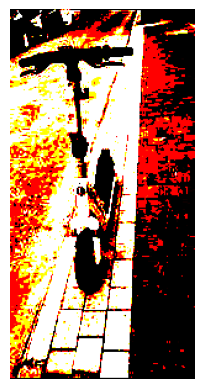

Predicted label: 3, True lable: 0


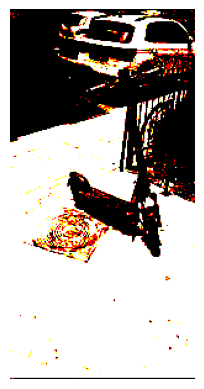

Predicted label: 3, True lable: 0


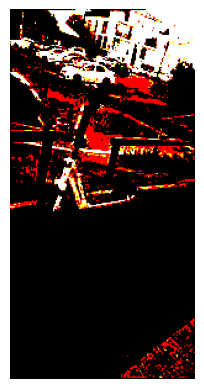

Predicted label: 0, True lable: 3


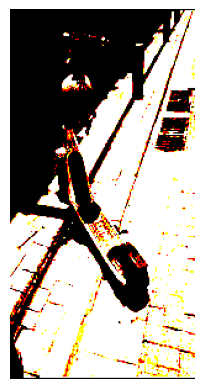

Predicted label: 0, True lable: 3


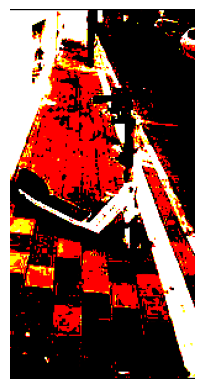

Predicted label: 3, True lable: 0


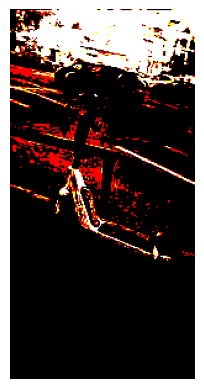

Predicted label: 3, True lable: 0


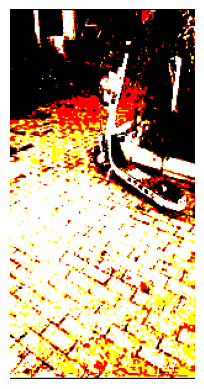

Predicted label: 3, True lable: 0


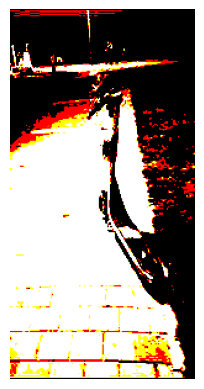

Predicted label: 0, True lable: 3


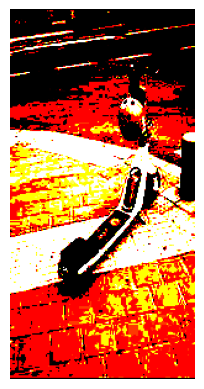

Predicted label: 3, True lable: 0


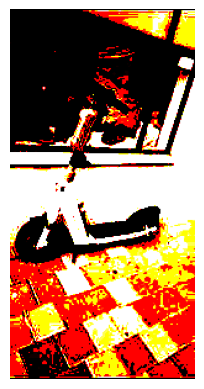

Predicted label: 2, True lable: 3


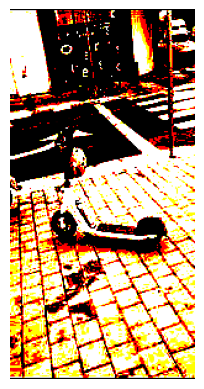

Predicted label: 0, True lable: 3


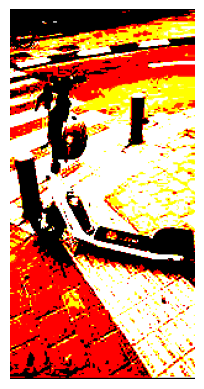

Predicted label: 3, True lable: 0


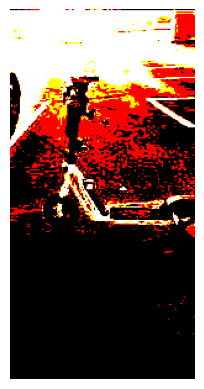

Predicted label: 3, True lable: 0


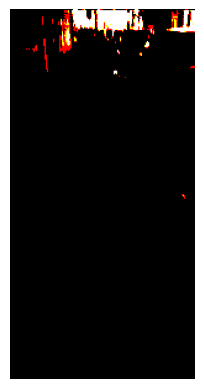

Predicted label: 0, True lable: 3


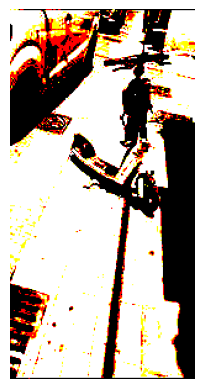

Predicted label: 3, True lable: 0


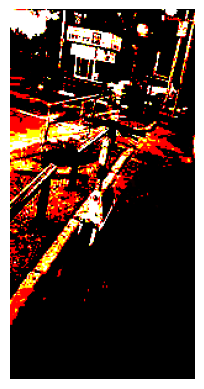

Predicted label: 3, True lable: 0


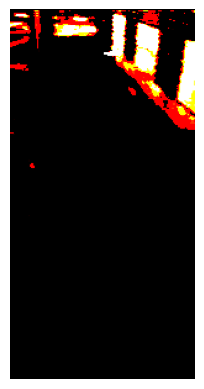

Predicted label: 3, True lable: 0


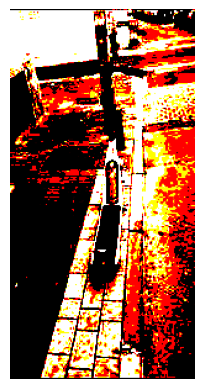

Predicted label: 0, True lable: 3


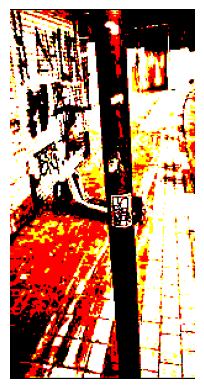

Predicted label: 0, True lable: 3


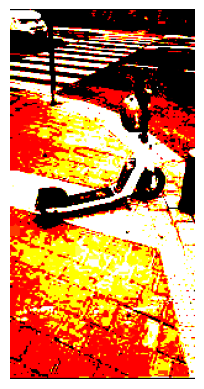

Predicted label: 0, True lable: 3


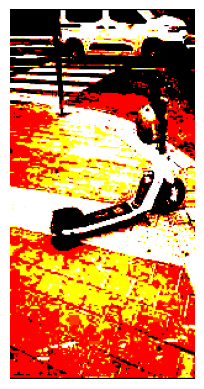

Predicted label: 3, True lable: 1


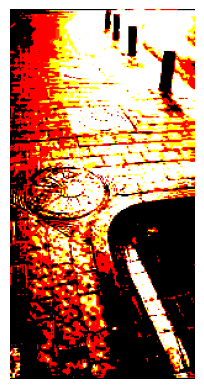

Predicted label: 3, True lable: 0


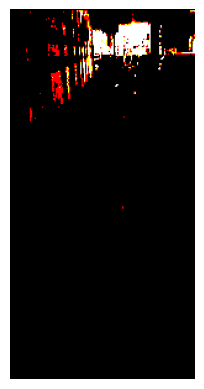

Predicted label: 0, True lable: 1


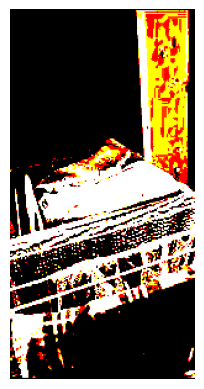

Predicted label: 3, True lable: 0


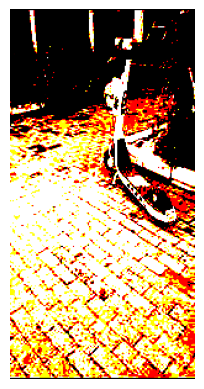

Predicted label: 3, True lable: 2


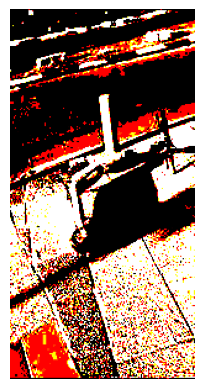

Predicted label: 3, True lable: 0


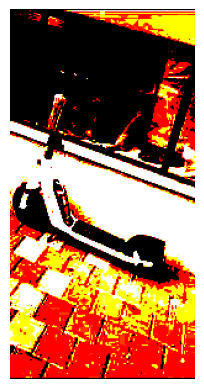

Predicted label: 0, True lable: 3


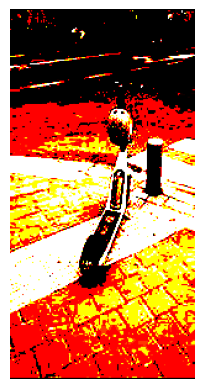

Predicted label: 0, True lable: 3


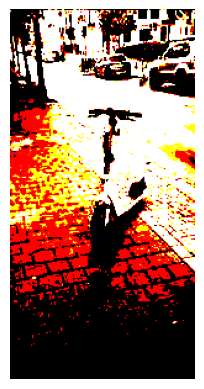

Predicted label: 3, True lable: 0


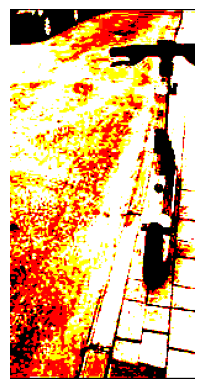

Predicted label: 0, True lable: 3


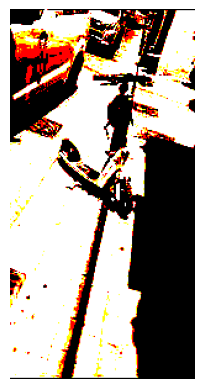

Predicted label: 0, True lable: 3


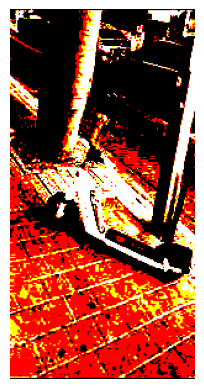

Predicted label: 0, True lable: 2


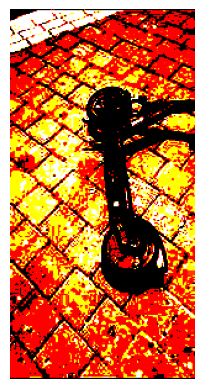

Predicted label: 3, True lable: 0


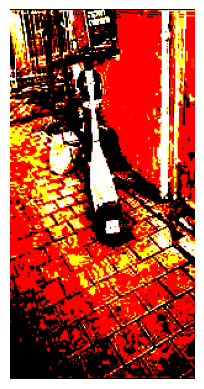

Predicted label: 0, True lable: 3


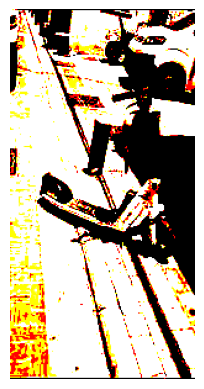

Predicted label: 0, True lable: 3


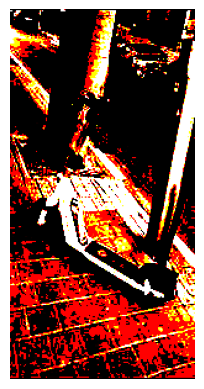

Predicted label: 0, True lable: 3


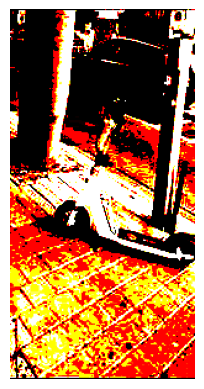

Predicted label: 0, True lable: 3


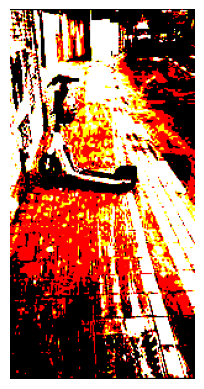

Predicted label: 3, True lable: 0


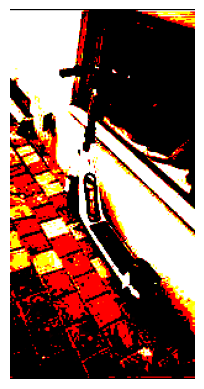

Predicted label: 3, True lable: 2


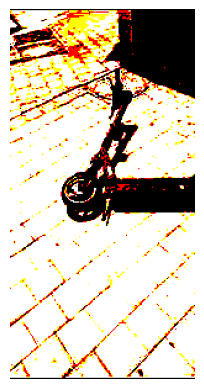

Predicted label: 3, True lable: 0


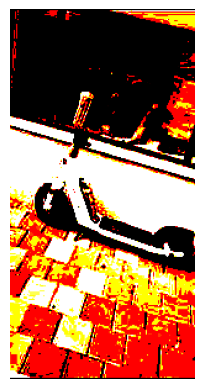

Predicted label: 3, True lable: 0


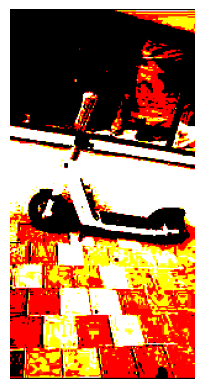

Predicted label: 3, True lable: 0


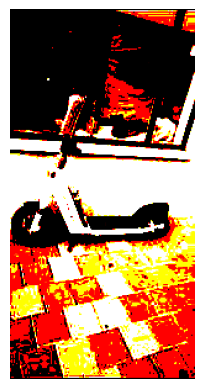

Predicted label: 3, True lable: 0


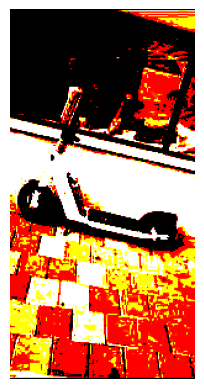

Predicted label: 2, True lable: 3


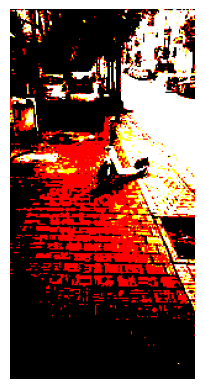

Predicted label: 0, True lable: 3


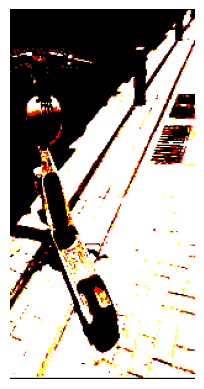

Predicted label: 0, True lable: 3


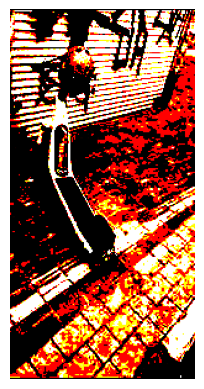

Predicted label: 0, True lable: 3


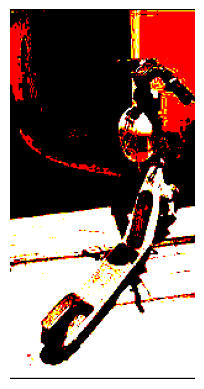

Predicted label: 0, True lable: 1


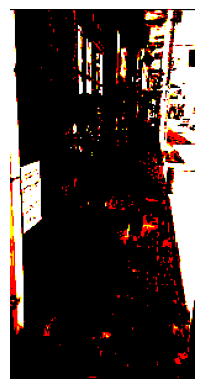

Predicted label: 3, True lable: 0


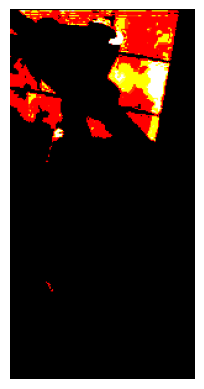

Predicted label: 0, True lable: 3


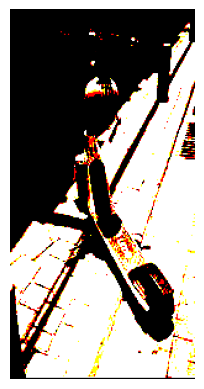

Predicted label: 3, True lable: 0


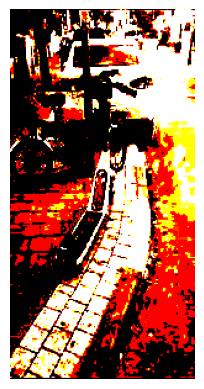

Predicted label: 3, True lable: 0


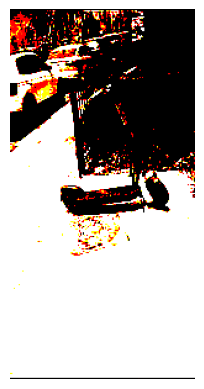

Predicted label: 0, True lable: 3


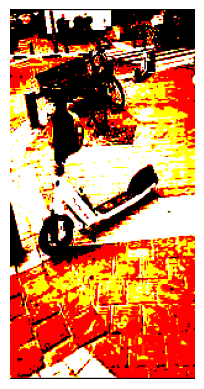

Predicted label: 0, True lable: 2


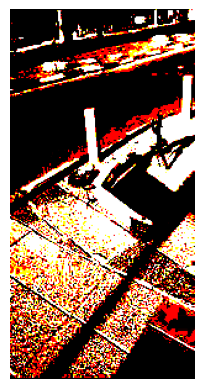

Predicted label: 3, True lable: 0


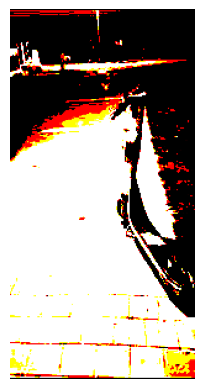

Predicted label: 2, True lable: 0


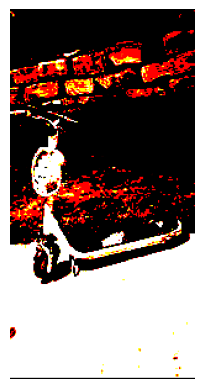

Predicted label: 3, True lable: 0


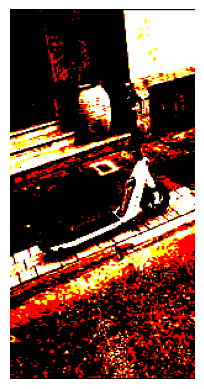

Predicted label: 3, True lable: 0


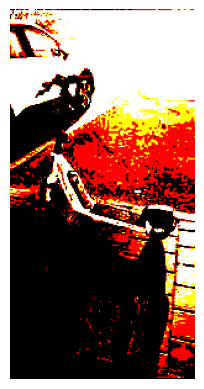

Predicted label: 0, True lable: 3


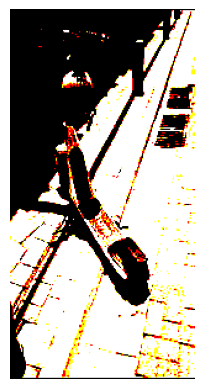

Predicted label: 3, True lable: 0


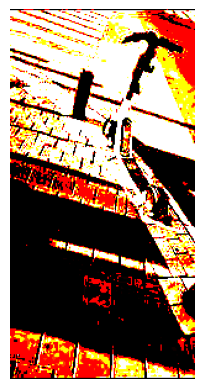

Predicted label: 0, True lable: 3


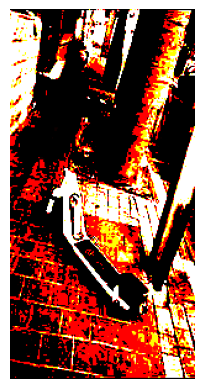

Predicted label: 0, True lable: 3


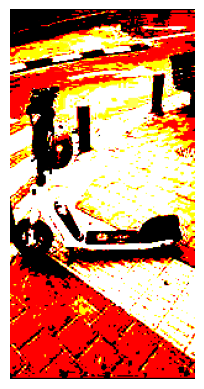

Predicted label: 0, True lable: 1


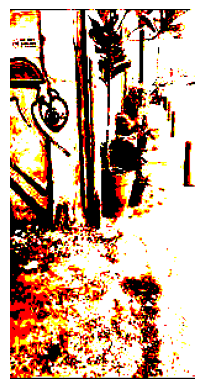

Predicted label: 1, True lable: 3


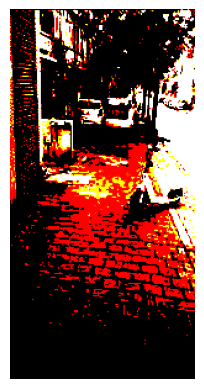

Predicted label: 0, True lable: 1


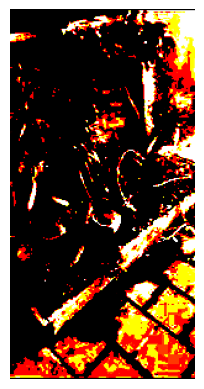

Predicted label: 0, True lable: 1


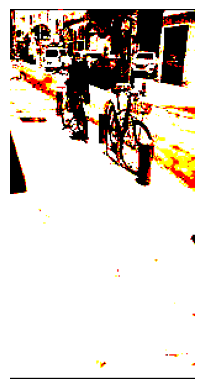

Predicted label: 3, True lable: 0


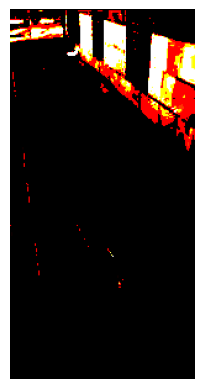

Predicted label: 3, True lable: 0


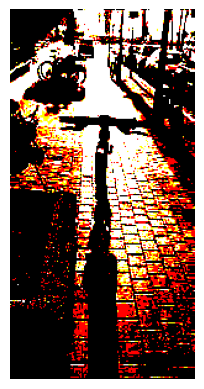

Predicted label: 0, True lable: 3


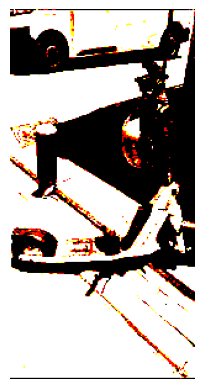

Predicted label: 0, True lable: 3


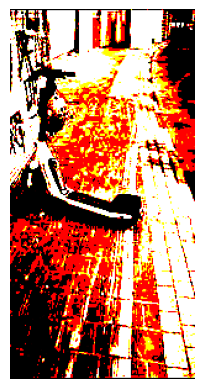

Predicted label: 3, True lable: 0


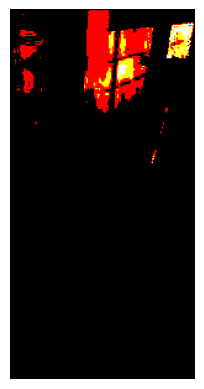

Predicted label: 0, True lable: 3


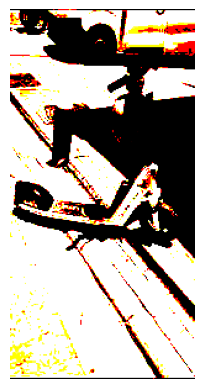

Predicted label: 3, True lable: 0


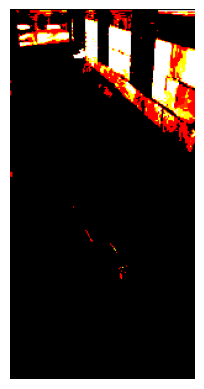

Predicted label: 0, True lable: 1


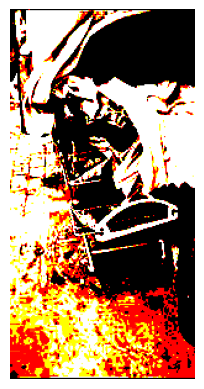

Predicted label: 3, True lable: 0


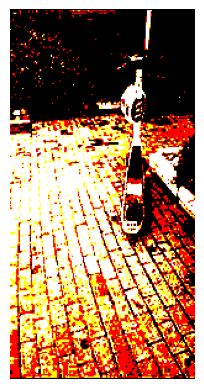

Predicted label: 1, True lable: 2


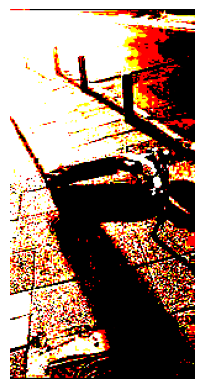

Predicted label: 0, True lable: 3


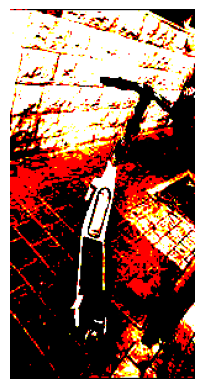

Predicted label: 1, True lable: 0


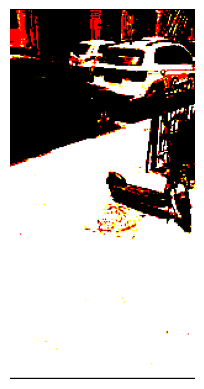

Predicted label: 0, True lable: 3


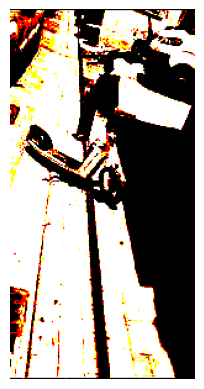

Predicted label: 3, True lable: 2


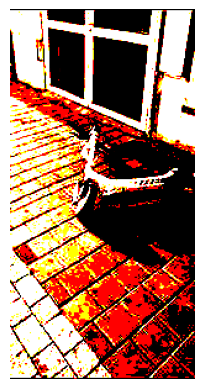

Predicted label: 0, True lable: 3


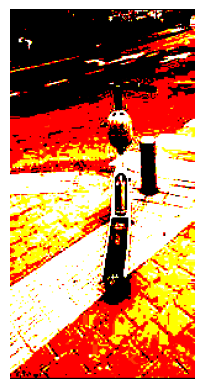

Predicted label: 2, True lable: 3


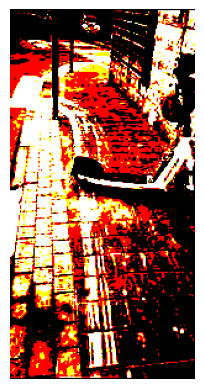

Predicted label: 3, True lable: 0


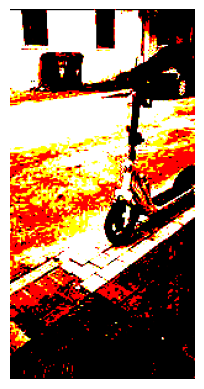

Predicted label: 3, True lable: 0


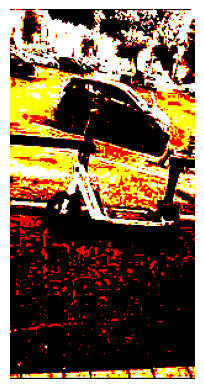

Predicted label: 0, True lable: 1


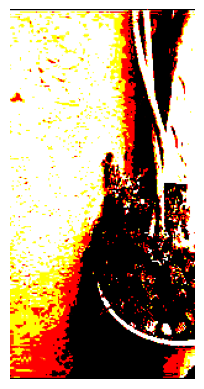

Predicted label: 0, True lable: 2


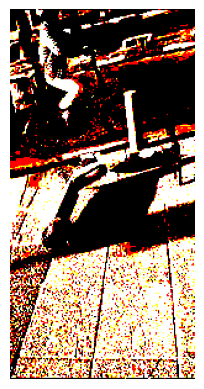

Predicted label: 3, True lable: 0


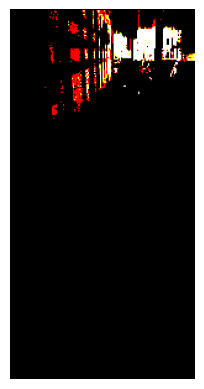

Predicted label: 3, True lable: 0


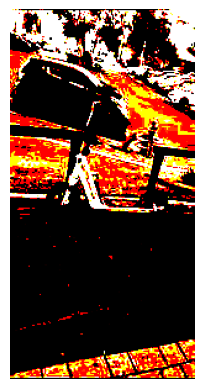

Predicted label: 3, True lable: 0


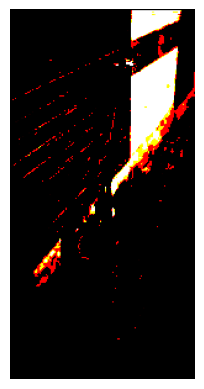

Predicted label: 1, True lable: 0


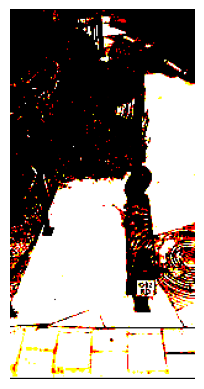

Predicted label: 0, True lable: 3


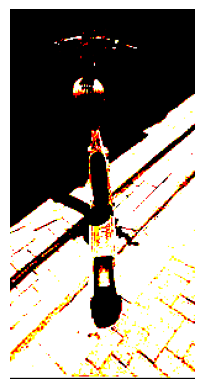

Predicted label: 3, True lable: 0


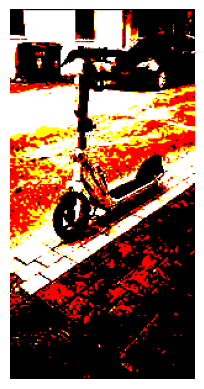

Predicted label: 3, True lable: 0


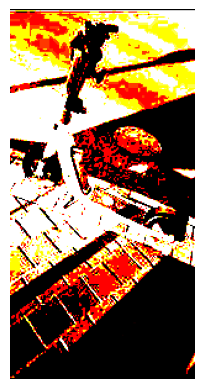

Predicted label: 1, True lable: 0


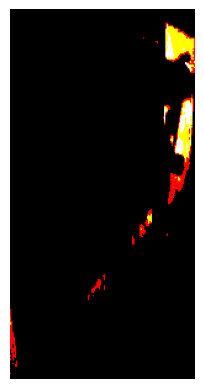

Predicted label: 3, True lable: 1


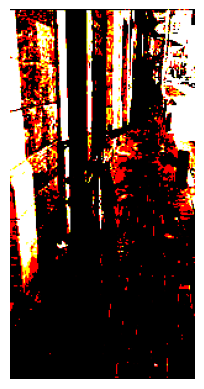

Predicted label: 3, True lable: 0


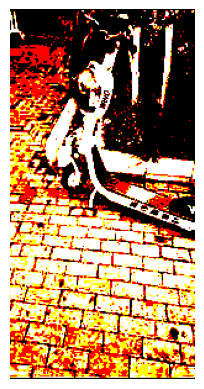

Predicted label: 3, True lable: 0


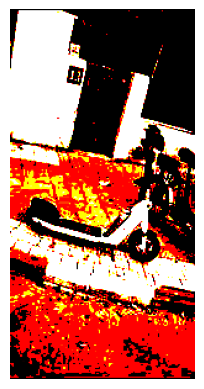

Predicted label: 3, True lable: 0


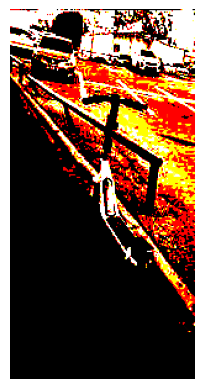

Predicted label: 0, True lable: 3


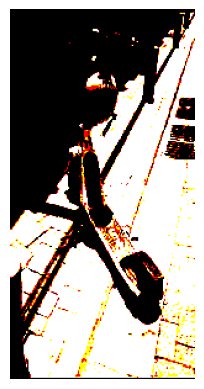

Predicted label: 3, True lable: 0


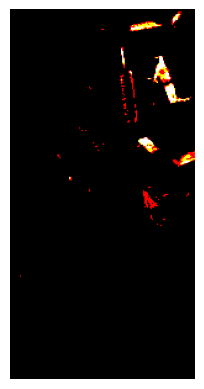

Predicted label: 3, True lable: 0


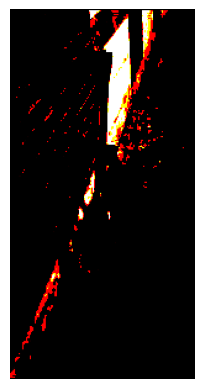

Predicted label: 3, True lable: 0


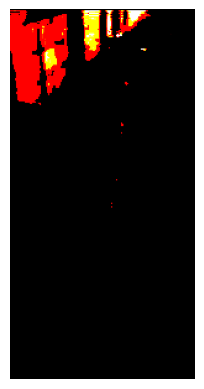

Predicted label: 3, True lable: 0


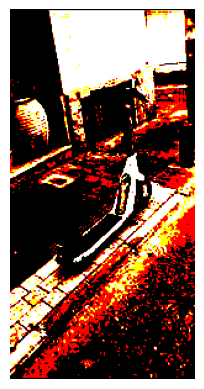

Predicted label: 3, True lable: 0


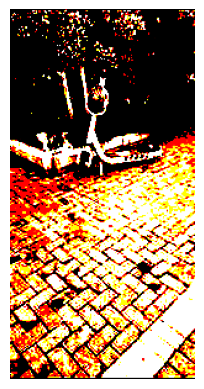

Predicted label: 2, True lable: 3


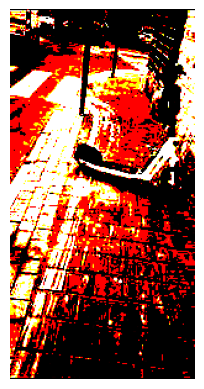

Predicted label: 0, True lable: 3


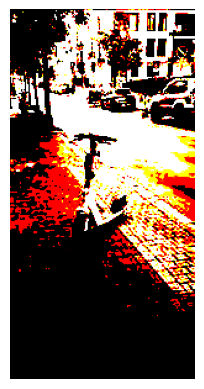

Predicted label: 0, True lable: 3


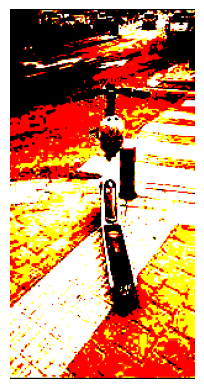

Predicted label: 3, True lable: 2


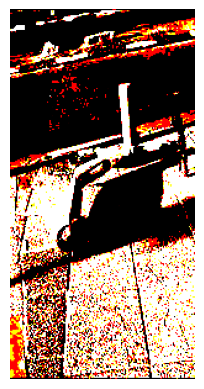

Predicted label: 3, True lable: 0


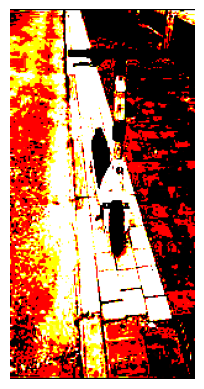

Predicted label: 0, True lable: 3


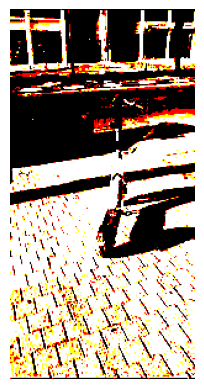

Predicted label: 3, True lable: 0


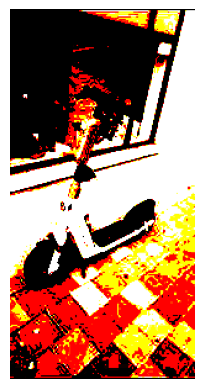

Predicted label: 1, True lable: 0


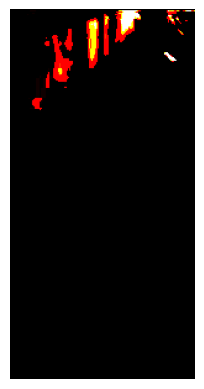

Predicted label: 3, True lable: 0


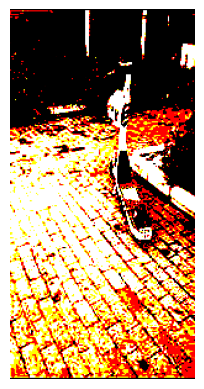

Predicted label: 3, True lable: 0


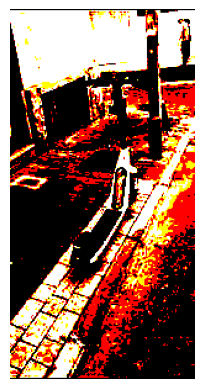

Predicted label: 3, True lable: 0


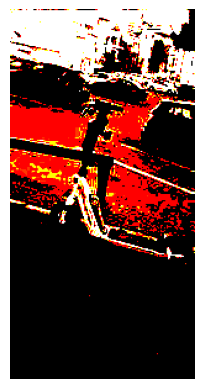

Predicted label: 3, True lable: 0


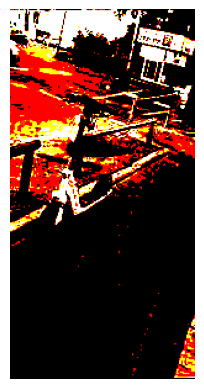

Predicted label: 0, True lable: 3


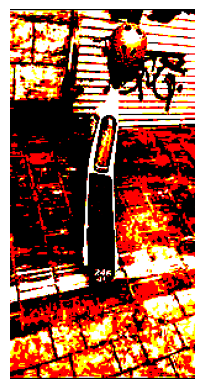

Predicted label: 0, True lable: 2


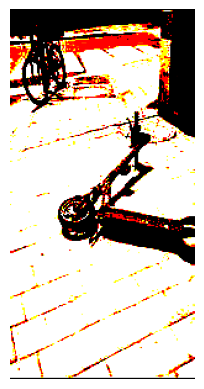

Predicted label: 0, True lable: 3


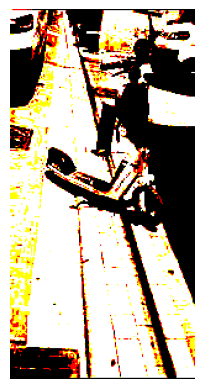

Predicted label: 3, True lable: 0


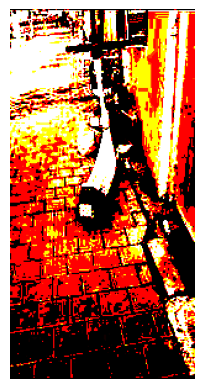

Predicted label: 0, True lable: 3


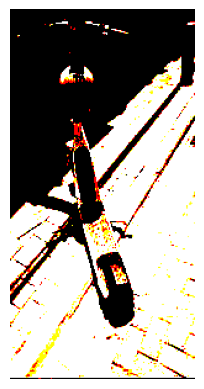

Predicted label: 0, True lable: 1


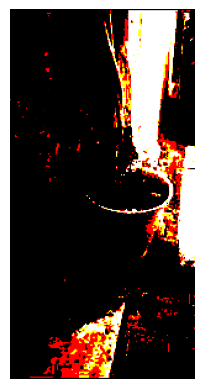

Predicted label: 3, True lable: 0


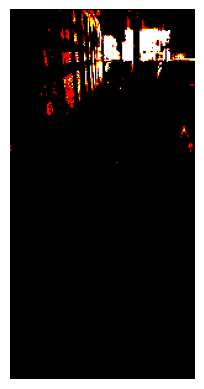

Predicted label: 3, True lable: 0


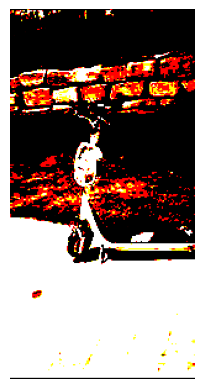

Predicted label: 0, True lable: 3


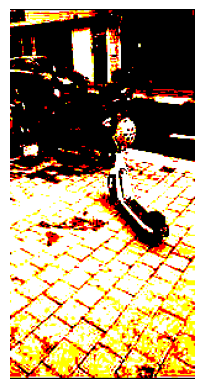

Predicted label: 3, True lable: 0


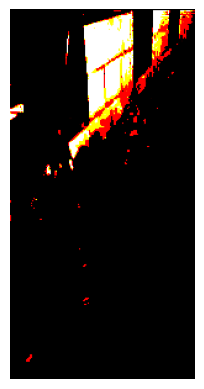

Predicted label: 0, True lable: 3


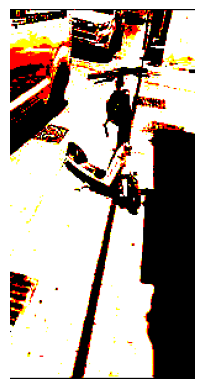

Predicted label: 2, True lable: 3


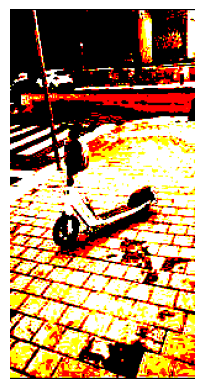

Predicted label: 3, True lable: 0


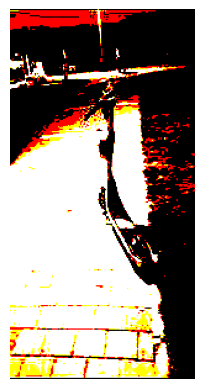

Predicted label: 0, True lable: 3


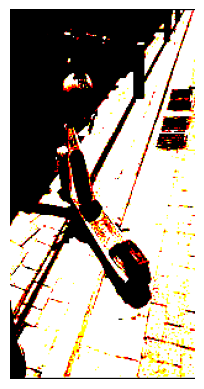

Predicted label: 0, True lable: 3


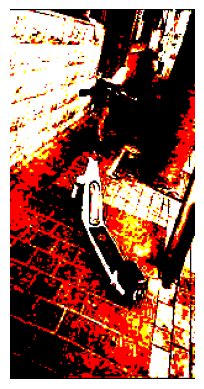

Predicted label: 0, True lable: 3


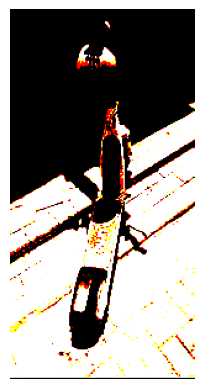

Predicted label: 0, True lable: 3


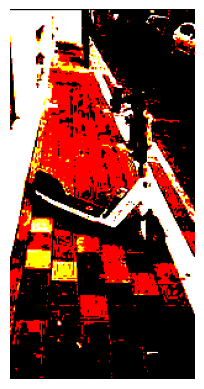

Predicted label: 0, True lable: 3


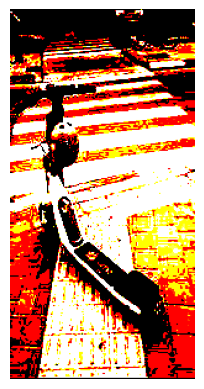

Predicted label: 3, True lable: 2


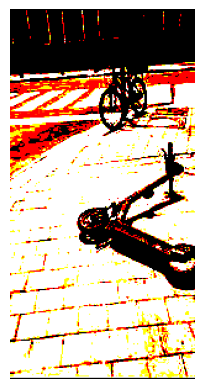

Predicted label: 0, True lable: 2


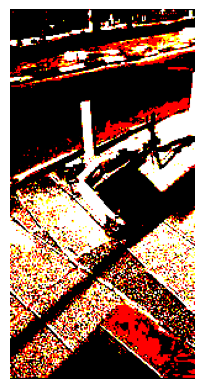

Predicted label: 0, True lable: 3


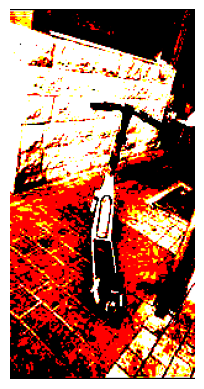

Predicted label: 0, True lable: 2


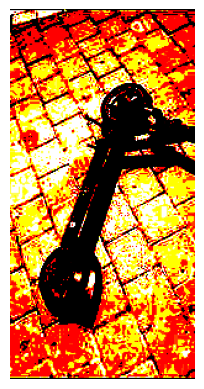

Predicted label: 3, True lable: 0


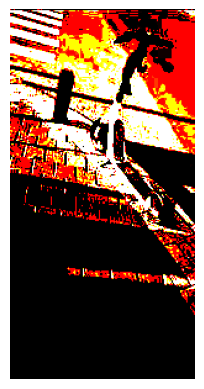

Predicted label: 3, True lable: 0


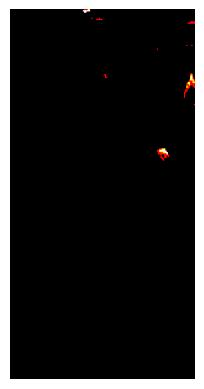

Predicted label: 3, True lable: 1


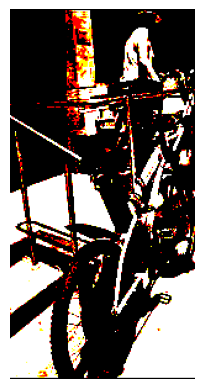

Predicted label: 3, True lable: 0


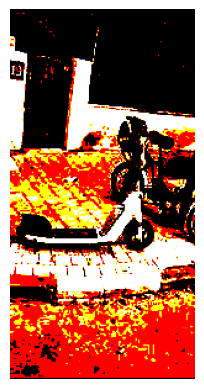

Predicted label: 3, True lable: 0


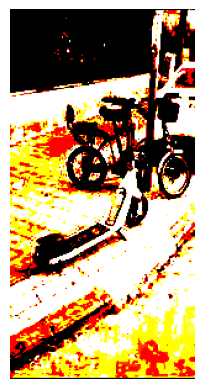

Predicted label: 0, True lable: 3


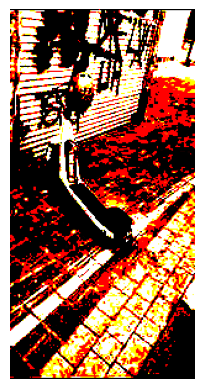

Predicted label: 0, True lable: 3


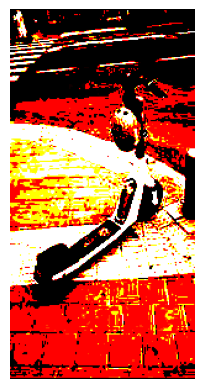

Predicted label: 1, True lable: 0


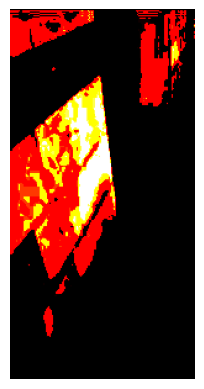

Predicted label: 3, True lable: 0


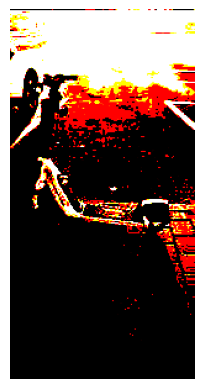

Predicted label: 1, True lable: 0


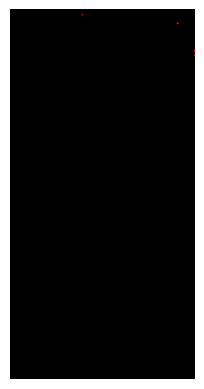

Predicted label: 0, True lable: 3


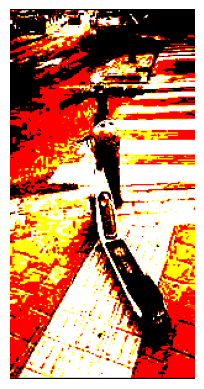

Predicted label: 0, True lable: 1


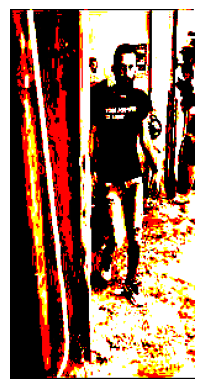

Predicted label: 3, True lable: 0


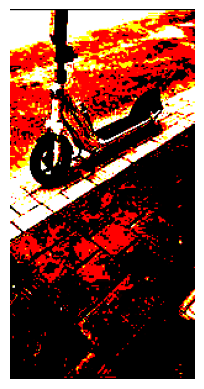

Predicted label: 3, True lable: 0


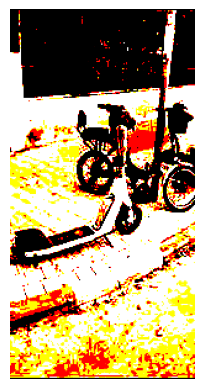

Predicted label: 3, True lable: 0


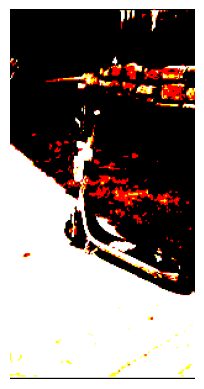

Predicted label: 3, True lable: 0


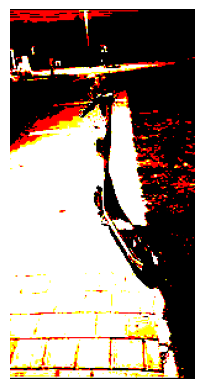

Predicted label: 3, True lable: 0


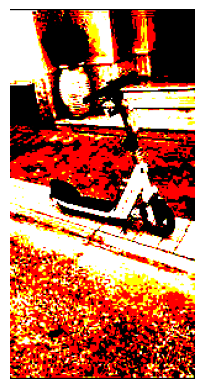

Predicted label: 3, True lable: 0


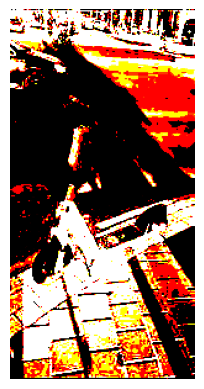

In [117]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming you have a NumPy array called 'image_array'
# containing the image data

for index in indices[0]:
  print(f"Predicted label: {predicted_labels[index]}, True lable: {test_labels[index]}")
  plt.imshow(test_images[index])
  plt.axis('off')  # Optional: turn off the axis labels
  plt.show()